100% |########################################################################|


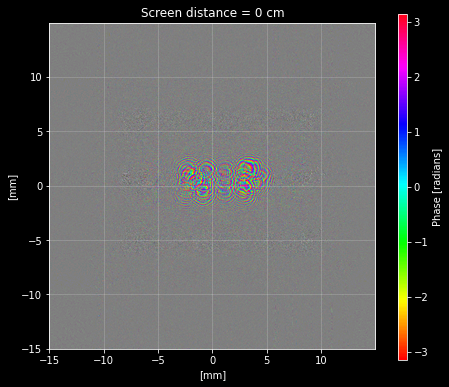

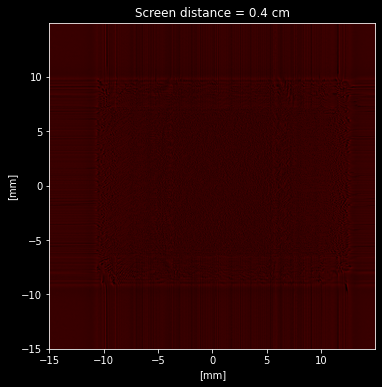

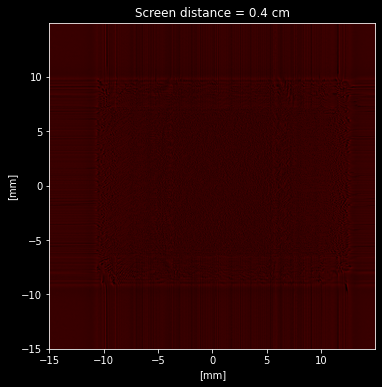

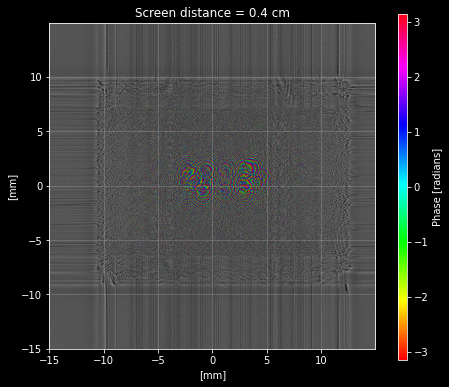

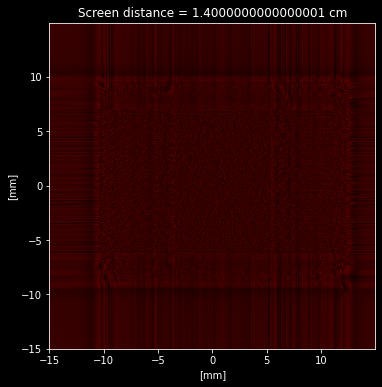

...

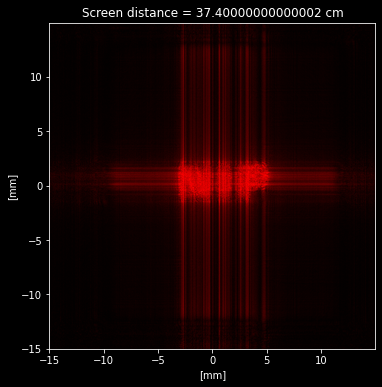

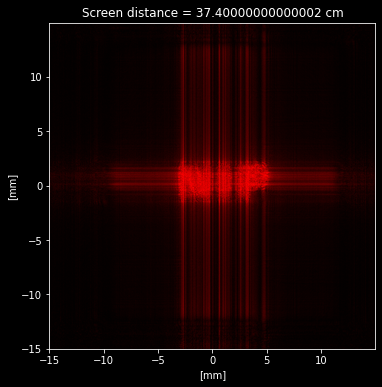

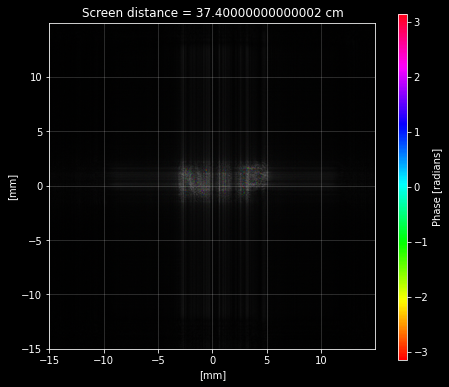

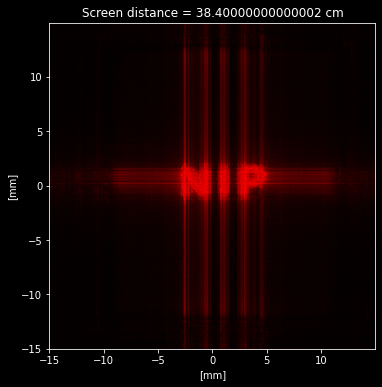

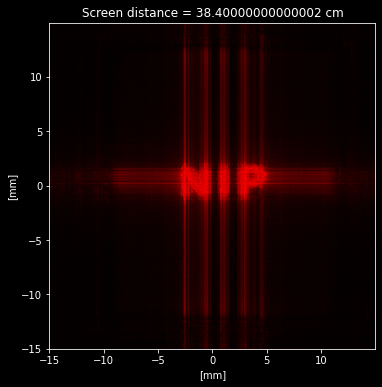

In [13]:
import diffractsim
diffractsim.set_backend("CPU")

from diffractsim import MonochromaticField, mm, nm, cm, CustomPhaseRetrieval, ApertureFromImage


#Note: CustomPhaseRetrieval requires autograd which is not installed by default with diffractsim. 
# To install autograd, type: 'pip install autograd'


# Generate a 30cm plane phase hologram
distance = 40*cm
PR = CustomPhaseRetrieval(wavelength=633 * nm, z = distance, extent_x=30 * mm, extent_y=30 * mm, 
                          Nx=2048, Ny=2048)

PR.set_source_amplitude(amplitude_mask_path= "white_background.png", image_size=(30.0 * mm, 30.0 * mm))
PR.set_target_amplitude(amplitude_mask_path= "nip.jpg", image_size=(30.0 * mm, 30.0 * mm))

PR.retrieve_phase_mask(max_iter = 30, method = 'Adam-Optimizer')
PR.save_retrieved_phase_as_image('nip_phase_r.png')



#Add a plane wave

F = MonochromaticField(
    wavelength=633 * nm, extent_x=30 * mm, extent_y=30 * mm, Nx=2048, Ny=2048, intensity = 0.001
)


F.add(ApertureFromImage(
     amplitude_mask_path= "white_background.png", 
     image_size=(30.0    * mm, 30.0  * mm), simulation = F)
)



F.add(ApertureFromImage(
     phase_mask_path= "nip_phase_r.png", 
     image_size=(30.0   * mm, 30.0 * mm), simulation = F)
)




E = F.get_field()
F.plot_phase(E, grid = True, units = mm)

# propagate field 30*cm
F.propagate(distance*cm)

# plot reconstructed image
rgb = F.get_colors()

F.plot_colors(rgb, image_name = "1")
F.plot_colors(rgb)


n = 40
for i in range(2,(n+2),1):
    # plot phase at z = 0
    E = F.get_field()
    F.plot_phase(E, grid = True, units = mm)

    # propagate field 30*cm
    F.propagate(1*cm)

    # plot reconstructed image
    rgb = F.get_colors()

    F.plot_colors(rgb, image_name = "{}".format(i))
    F.plot_colors(rgb)

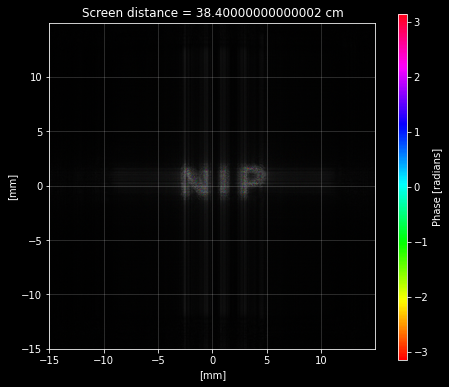

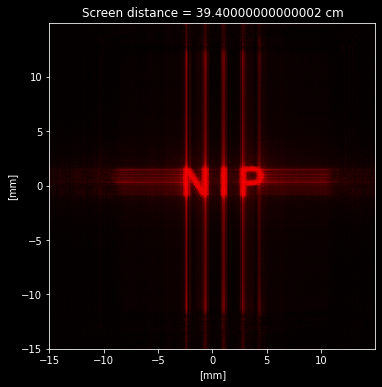

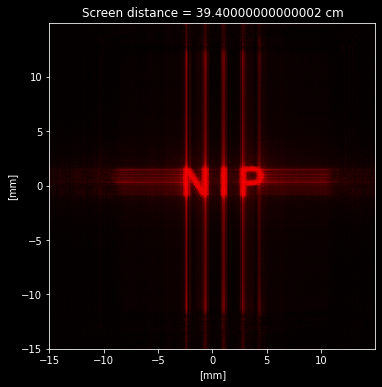

In [15]:
    E = F.get_field()
    F.plot_phase(E, grid = True, units = mm)

    # propagate field 30*cm
    F.propagate(1*cm)

    # plot reconstructed image
    rgb = F.get_colors()

    F.plot_colors(rgb, image_name = "{}".format(40))
    F.plot_colors(rgb)

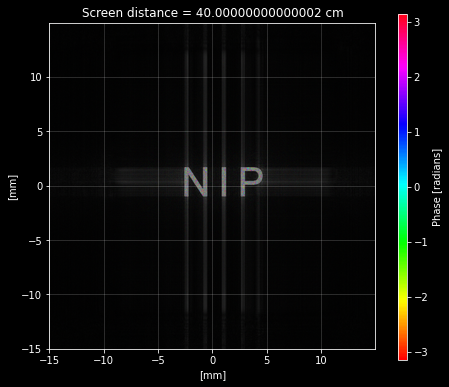

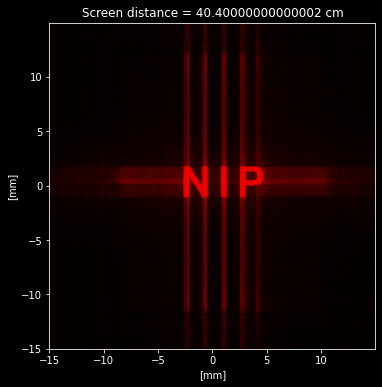

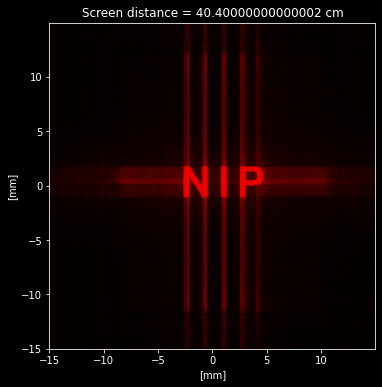

In [18]:
    E = F.get_field()
    F.plot_phase(E, grid = True, units = mm)

    # propagate field 30*cm
    F.propagate(0.4*cm)

    # plot reconstructed image
    rgb = F.get_colors()

    F.plot_colors(rgb, image_name = "{}".format(41))
    F.plot_colors(rgb)

In [19]:
# Python program to explain os.path.split() method 
    
# importing os module 
import os
  
# path
path = '/home/User/Desktop/file.txt'
  
# Split the path in 
# head and tail pair
head_tail = os.path.split(path)
  
# print head and tail
# of the specified path
print("Head of '% s:'" % path, head_tail[0])
print("Tail of '% s:'" % path, head_tail[1], "\n")
  
  
# path
path = '/home/User/Desktop/'
  
# Split the path in 
# head and tail pair
head_tail = os.path.split(path)
  
# print head and tail
# of the specified path
print("Head of '% s:'" % path, head_tail[0])
print("Tail of '% s:'" % path, head_tail[1], "\n")
  
# path
path = 'file.txt'
  
# Split the path in 
# head and tail pair
head_tail = os.path.split(path)
  
# print head and tail
# of the specified path
print("Head of '% s:'" % path, head_tail[0])
print("Tail of '% s:'" % path, head_tail[1])

Head of '/home/User/Desktop/file.txt:' /home/User/Desktop
Tail of '/home/User/Desktop/file.txt:' file.txt 

Head of '/home/User/Desktop/:' /home/User/Desktop
Tail of '/home/User/Desktop/:'  

Head of 'file.txt:' 
Tail of 'file.txt:' file.txt
